# Prediction of Cellular Composition using CNNs
In this assignment, the objective is to develop a regression model for predicting the number of six different types of cells in a given histological image patch as well as the total number of cells in the image patch


---
## Data Loading + initial analysis of the dataset

In [348]:
import os
import numpy as np
import pandas as pd
from os.path import join as join
import matplotlib.pyplot as plt
from skimage.color import rgb2hed, hed2rgb
from scipy import stats
from skimage import filters
from sklearn.decomposition import IncrementalPCA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from matplotlib.lines import Line2D
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable
from tqdm.notebook import tqdm
from torch.utils.data import random_split


In [2]:
# data loading
data_dir = '../data'  # change for your datafiles

X = np.load(join(data_dir,"images.npy"))     # read images
Y = pd.read_csv(join(data_dir,'counts.csv')) # read cell counts
F = np.loadtxt(join(data_dir,'split.txt'), dtype=np.int)   # read fold information
print(f"Image shape: {X.shape}"); print(f"Labels shape: {Y.shape}"); print(f"Split shape: {F.shape}")

# changing the column names to T1, T2, T3, T4, T5, T6
Ts = ['T1', 'T2', 'T3', 'T4', 'T5', 'T6']
T2name, name2T = dict(zip(Ts, Y.columns)), dict(zip(Y.columns, Ts))
Y.columns = Ts
Ydf = Y.copy()   # creating Y dataframe with fold and total count information
Ydf['total'] = Y.T1 + Y.T2 + Y.T3 + Y.T4 + Y.T5 + Y.T6  # adding the total count column
Ydf['fold'] = F  # adding the fold column

Image shape: (4981, 256, 256, 3)
Labels shape: (4981, 6)
Split shape: (4981,)


---
## Question 1: Data Analysis
i. &emsp;&nbsp;   How many examples are there in each fold?
   * There are 1622 examples in fold 1
   * There are 1751 examples in fold 2
   * There are 1608 examples in fold 3
   * There are 4981 examples in total

ii. &emsp;  Show some image examples using plt.imshow. Describe your observations on what you
see in the images and how it correlates with the cell counts of different types of cells and the
overall number of cells.
   * We can see images of tissue with different cell composition with components of different shapes and colors
   * It seems that a cell type (T1, T2,...) is characterised by both its color and its shape, for instance:
      *  T3 (lymphocyte) is very dark and round while T2 (epithelial) is lighter in colour, usually has a brighter center and does not have to be round
      * T5 is associated with the redder shade
      *  T6 is associated with elongated shape
   * It is important to note that some types of cells (T2, T3) are much more common than others. The maximal counts can differ in order of magnitude
   * It seems that the images vary in shade: some images tend to be much brighter than others -> this might be a complication
   * Overall, the images demonstrate how hard task the regression on cellular composition is: the model has to be able to segment and classify the indivudal cells which seems to be rather complicated task, as the differences seem to be quite small between some types.
   * it is clear the overall number of cells is correlated with the number/length of edge contours, hence edge detection will probably be helpful with that.

iii. &emsp; For each fold, plot the histogram of counts of each cell type separately as well as the total
number of cells (7 plots in total). How many images have counts within each of the following bins?
* 0-1,&emsp;&emsp;&nbsp; in fold 1: 39,&emsp; in fold 2: 54,&emsp; in fold 3: 57,&emsp; in all folds: 150
* 1-6,&emsp;&emsp;&nbsp; in fold 1: 17,&emsp; in fold 2: 13,&emsp; in fold 3: 31,&emsp; in all folds: 61
* 6-11,&emsp;&nbsp;&nbsp; in fold 1: 15,&emsp; in fold 2: 30,&emsp; in fold 3: 36,&emsp; in all folds: 81
* 11-21,&emsp; in fold 1: 23,&emsp; in fold 2: 51,&emsp; in fold 3: 85,&emsp; in all folds: 159
* 21-31,&emsp; in fold 1: 47,&emsp; in fold 2: 47,&emsp; in fold 3: 90,&emsp; in all folds: 184
* 31-41,&emsp; in fold 1: 43,&emsp; in fold 2: 66,&emsp; in fold 3: 97,&emsp; in all folds: 206
* 41-51,&emsp; in fold 1: 65,&emsp; in fold 2: 107,&emsp; in fold 3: 71,&emsp; in all folds: 243
* 51-61,&emsp; in fold 1: 83,&emsp; in fold 2: 137,&emsp; in fold 3: 105,&emsp; in all folds: 325
* 61-71,&emsp; in fold 1: 94,&emsp; in fold 2: 134,&emsp; in fold 3: 118,&emsp; in all folds: 346
* 71-81,&emsp; in fold 1: 132,&emsp; in fold 2: 135,&emsp; in fold 3: 124,&emsp; in all folds: 391
* 81-91,&emsp; in fold 1: 164,&emsp; in fold 2: 162,&emsp; in fold 3: 133,&emsp; in all folds: 459
* 91-100,&nbsp; in fold 1: 125,&emsp; in fold 2: 143,&emsp; in fold 3: 116,&emsp; in all folds: 384
* $>$100,&nbsp;&nbsp; in fold 1: 775,&emsp; in fold 2: 672,&emsp; in fold 3: 545,&emsp; in all folds: 1992

iv. &emsp; Pre-processing: Convert and show a few images from RGB space to HED space and show the H-channel which should indicate cellular nuclei.

v. &emsp; Do a scatter plot of the average of the H-channel for each image vs. its cell count of a certain type and the total number of cells for images in Fold-1 (7 plots in total). Do you think this feature would be useful in your regression model? Explain your reasoning.
* The scatter plots display certain level of positive correlation between average of the H-channel and the number of cellular counts. However, there is not a very strong correlation for any of the cell types. The strongest correlation can be seen for the total number of cells, where the pearson's correlation coefficient is 0.457 and in terms of the individual cell counts, it is most singnificant in case of T3 (lymphocytes) where the coefficient is equal to 0.376. For the other cell types, there is a positive correlation but it is rather weak.
* The reason why we can see the correlation is that the cellular composition must have some impact on the H-channel. In particular, higher cell counts mean higher nuclei counts and H-channel should be indicative of that. Furthermore, our observations imply that the cell type influences the appearance of the nuclei in the H-channel, because if that was not the case, we would expect to see similar result for all the cell types, however, we have seen that they do not have exactly the same distribution.
* Therefore, yes, this feature could be useful in the regression model, however, on its own it will not be sufficient to achieve good regression results because the trend in the data is not strong enough. Also, if used, this feature will be more useful for some cell types (T2, T3) while for other data types it will not be very helpful (T6). Again, this means that on it own, this feature could not provide sufficient information for successful regression for all cell types and should be used in combination with other features.

vi. &emsp; What performance metrics can you use for this problem? Which one will be the best performance metric for this problem? Please give your reasoning.
* the problem at hand can be seen as 6 (or 7, including the total cell count) regression problems. There are number of metrics which can be used for regression. Those include the Mean Square Error (MSE), Root-mean Square Error (RMSE), Mean Absolute Error (MAE) and Coefficient of Determination (R-squared) or its alternative Adjusted R-squared.
* There is nothing like a best performance metric for regression, it is always dependent on the problem setting: RMSE is less sensitive to outliers than MSE. But being sensitive to outliers might be a positive thing, depending on the objective. One particular advantage of RMSE and MAE is that their units are the units of the regression (in this case cell count) which makes them easily interpretable. However, they are not very good for standardization - because mistaking 5 cell counts on average might be very good if we are analyzing images which have thousands of cells but if we are analyzing images with 10 cells on average, it is not anymore very good.
* Therefore, if we want to compare our models with others, R-squared is a good metric. Firstly because it is generally accepted (the CoNIC challenge uses averaged R-squared over each cell-type) so we can easily compare this metric with others as it is very common and secondly because it has useful properties (is generally between 0-1 and the model is penalized more for bigger error).
* If I had to choose one metric, I would use R-squared metric because of its properties and because it is the actual metric for the CoNIC challenge. Fortunately, I do not have to select only one metric and therefore I can use R-squared together with other metrics such as MAE, which would help me to interpret the results of the multiple regression. All those metrics can be afterwards averqaged over all the cell types. It could be a simple average or alternatively a weighted average where each r-squeared would be weighted with the number of examples of that cell-type. I would probably use a weighted average if there was a very serious class imbalance as that could introduce large discrepancy between the performance of the model for generalization.


In [56]:
## i.
# There are 1622 examples in fold 1
# There are 1751 examples in fold 2
# There are 1608 examples in fold 3
# There are 4981 examples in total

n_examples_fold1 = np.count_nonzero(F == 1)
n_examples_fold2 = np.count_nonzero(F == 2)
n_examples_fold3 = np.count_nonzero(F == 3)
n_total = n_examples_fold1 + n_examples_fold2 + n_examples_fold3

print(f"There are {n_examples_fold1} examples in fold 1")
print(f"There are {n_examples_fold2} examples in fold 2")
print(f"There are {n_examples_fold3} examples in fold 3")
print(f"There are {n_total} examples in total")

There are 1622 examples in fold 1
There are 1751 examples in fold 2
There are 1608 examples in fold 3
There are 4981 examples in total


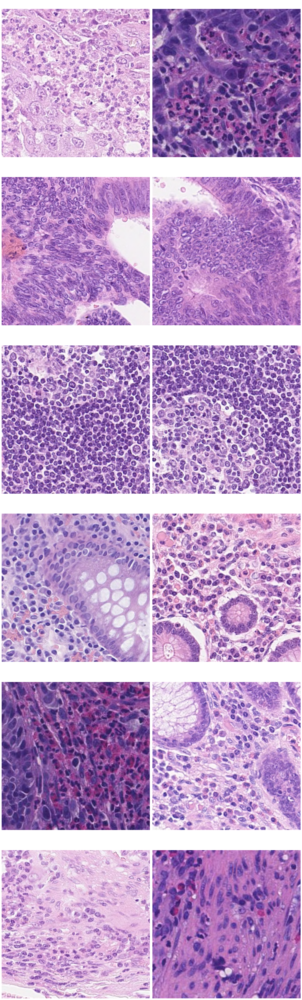

In [201]:
## ii.

# selecting images to which have the most of each cell type
inds = np.zeros(12)
inds[0] = Y[Y.T1 == np.max(Y, axis=1)].sort_values('T1', ascending=False).index[0]
inds[1] = Y[Y.T1 == np.max(Y, axis=1)].sort_values('T1', ascending=False).index[1]
inds[2] = Y[Y.T2 == np.max(Y, axis=1)].sort_values('T2', ascending=False).index[0]
inds[3] = Y[Y.T2 == np.max(Y, axis=1)].sort_values('T2', ascending=False).index[1]
inds[4] = Y[Y.T3 == np.max(Y, axis=1)].sort_values('T3', ascending=False).index[0]
inds[5] = Y[Y.T3 == np.max(Y, axis=1)].sort_values('T3', ascending=False).index[1]
inds[6] = Y[Y.T4 == np.max(Y, axis=1)].sort_values('T4', ascending=False).index[0]
inds[7] = Y[Y.T4 == np.max(Y, axis=1)].sort_values('T4', ascending=False).index[1]
inds[8] = Y.sort_values('T5', ascending=False).index[1]
inds[9] = Y.sort_values('T5', ascending=False).index[2]
inds[10] = Y[Y.T6 == np.max(Y, axis=1)].sort_values('T6', ascending=False).index[1]
inds[11] = Y[Y.T6 == np.max(Y, axis=1)].sort_values('T6', ascending=False).index[2]

# display those 6 images
fig = plt.figure(figsize=(18, 60))
rows = 6
columns = 2

for i in range(12):
    ind = int(inds[i])
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(X[ind])
    plt.title(f"{ind}  counts: {Y.iloc[ind,:].values}", color = 'white', fontsize=32)
    plt.axis('off')
plt.tight_layout()
plt.show()



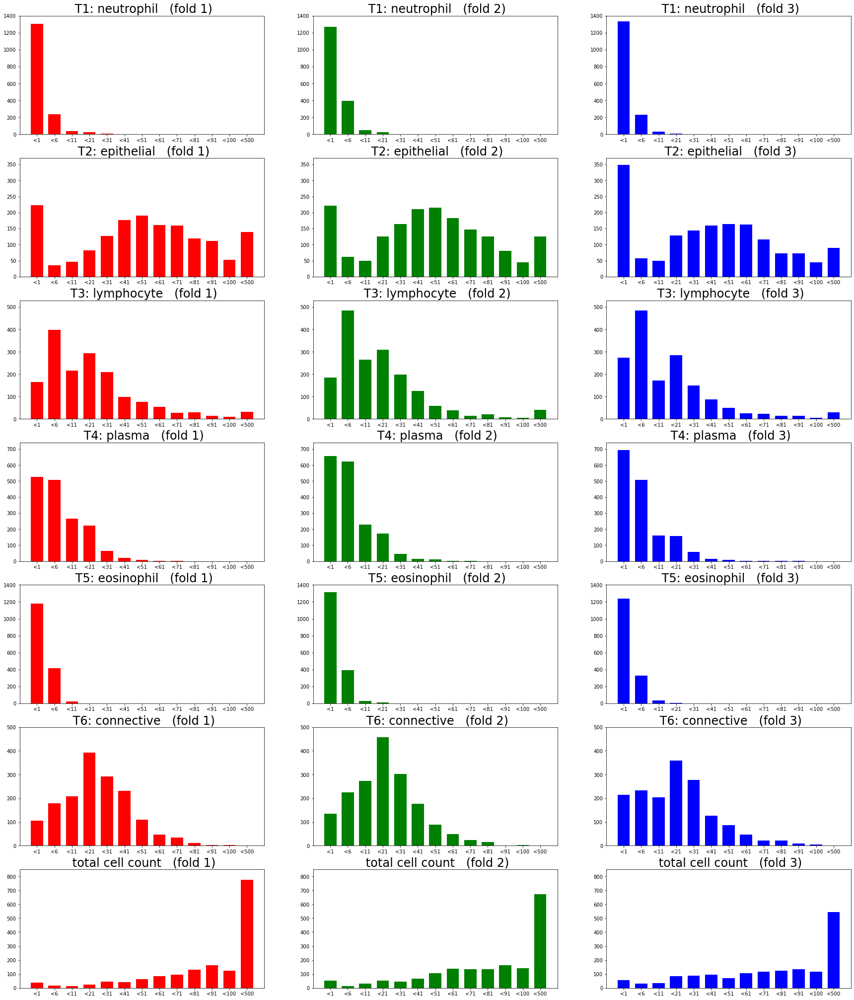

Total cell counts by range
 range 	 fold 1 count	 fold 2 count	 fold 3 count	 total count
 0-1	  in fold 1: 39	 in fold 2: 54	 in fold 3: 57	 in all folds: 150
 1-6	  in fold 1: 17	 in fold 2: 13	 in fold 3: 31	 in all folds: 61
 6-11	  in fold 1: 15	 in fold 2: 30	 in fold 3: 36	 in all folds: 81
 11-21	  in fold 1: 23	 in fold 2: 51	 in fold 3: 85	 in all folds: 159
 21-31	  in fold 1: 47	 in fold 2: 47	 in fold 3: 90	 in all folds: 184
 31-41	  in fold 1: 43	 in fold 2: 66	 in fold 3: 97	 in all folds: 206
 41-51	  in fold 1: 65	 in fold 2: 107	 in fold 3: 71	 in all folds: 243
 51-61	  in fold 1: 83	 in fold 2: 137	 in fold 3: 105	 in all folds: 325
 61-71	  in fold 1: 94	 in fold 2: 134	 in fold 3: 118	 in all folds: 346
 71-81	  in fold 1: 132	 in fold 2: 135	 in fold 3: 124	 in all folds: 391
 81-91	  in fold 1: 164	 in fold 2: 162	 in fold 3: 133	 in all folds: 459
 91-100	  in fold 1: 125	 in fold 2: 143	 in fold 3: 116	 in all folds: 384
 >100 	  in fold 1: 775	 in fold 2: 67

In [210]:
## iii.
# plotting fold 1 in red, fold 2 in green and fold 3 in blue

f, a = plt.subplots (7,3, figsize=(30,36))
bins = [0,1,6,11,21,31,41,51,61,71,81,91,100, 500]  # largest possible count is 455 < 500
labs = ['<'+str(n) for n in bins[1:]]
cols = ['red', 'green', 'blue']
titles = [t + ': ' + name for t, name in T2name.items()]; titles.append("total cell count")
ranges = [1400, 370, 530, 740, 1400, 500, 850]
total_sums = [0,0,0]
for fold in [1, 2, 3]:
    df = Ydf[Ydf.fold == fold]  # fold dataframe
    for column in range(7):
        column_count = df.iloc[:,column]
        hist, edges = np.histogram(column_count, bins=bins)  # get the histogram counts

        a[column, fold-1].bar(np.arange(hist.shape[0]), hist, width=0.7, color=cols[fold-1])
        a[column, fold-1].set_xticks(ticks=np.arange(hist.shape[0]))
        a[column, fold-1].set_xticklabels(labels=labs)
        a[column, fold-1].set_ylim((0,ranges[column]))
        a[column, fold-1].set_title(f" {titles[column]}   (fold {str(fold)})", fontsize=24)
        if column == 6:
            total_sums[fold-1] = hist
plt.show()


# calculate the nubers of images with counts within the specified bins
print("Total cell counts by range\n range \t fold 1 count\t fold 2 count\t fold 3 count\t total count")
total_all_folds = np.sum(total_sums, axis=0)

for i in range(len(total_sums[0])-1):
    print(f" {bins[i]}-{bins[i+1]}\t  in fold 1: {total_sums[0][i]}\t in fold 2: {total_sums[1][i]}\t in fold 3: {total_sums[2][i]}\t in all folds: {total_all_folds[i]}")
print(f" >100 \t  in fold 1: {total_sums[0][-1]}\t in fold 2: {total_sums[1][-1]}\t in fold 3: {total_sums[2][-1]}\t in all folds: {total_all_folds[-1]}")

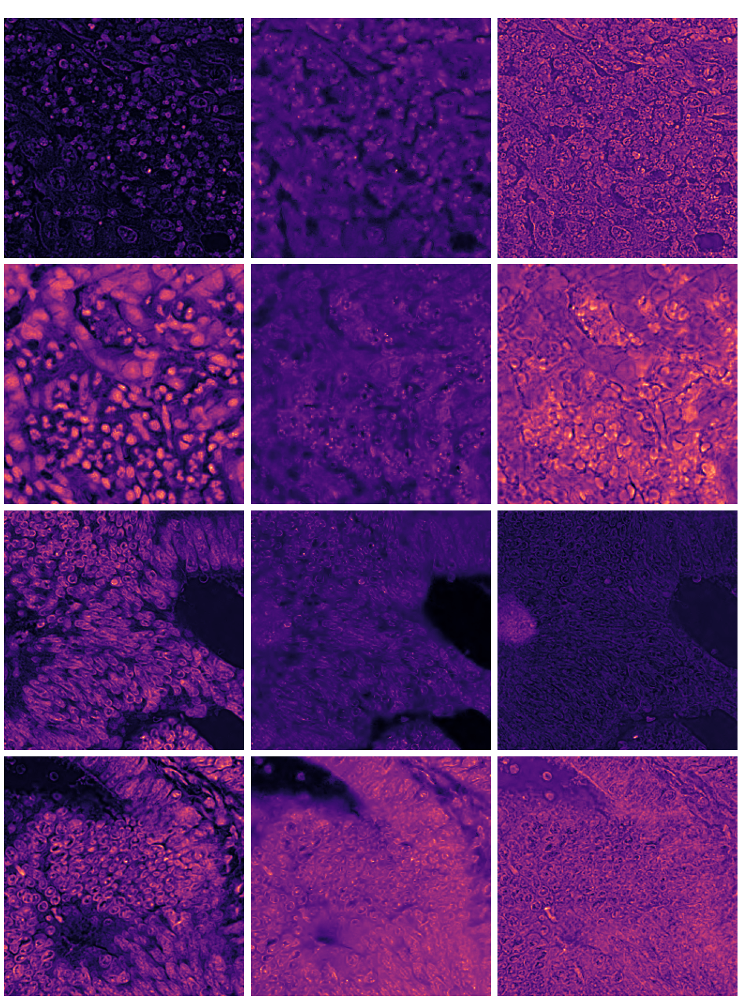

In [239]:
## iv.
# RGB -> HED

inds = np.array(inds[0:4], dtype=int)  # take 4 images to convert
f, a = plt.subplots(4,3, figsize=(18,24))

for i, ind in enumerate(inds):
    imRGB = X[ind]
    imHED = rgb2hed(imRGB)
    imH, imE, imD = imHED[:,:,0], imHED[:,:,1], imHED[:,:,2]

    for channel in [0,1,2]:
        a[i, channel].imshow(imHED[:,:,channel], cmap='magma'); a[i, channel].axis('off')
        if i == 0:
            a[0,0].set_title("Channel H", color='white', fontsize=25)
            a[0,1].set_title("Channel E", color='white', fontsize=25)
            a[0,2].set_title("Channel D", color='white', fontsize=25)

plt.tight_layout()
plt.show()

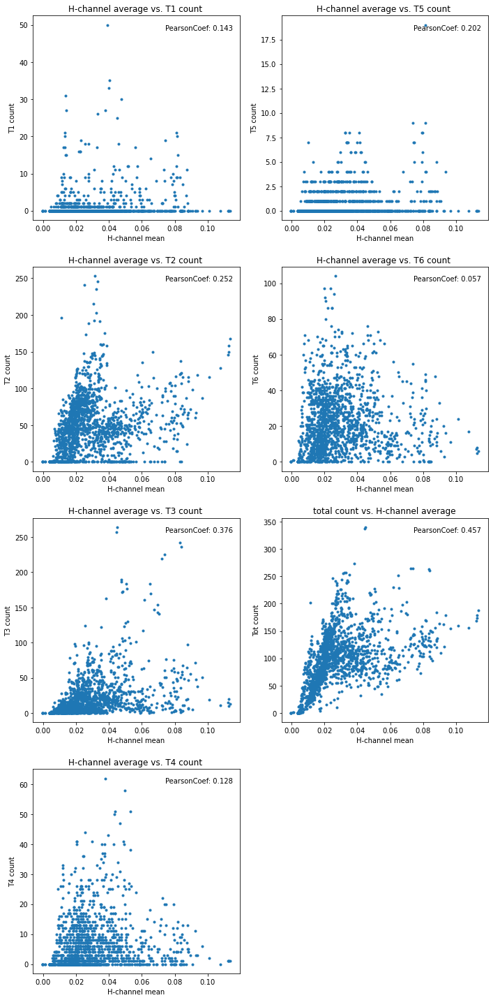

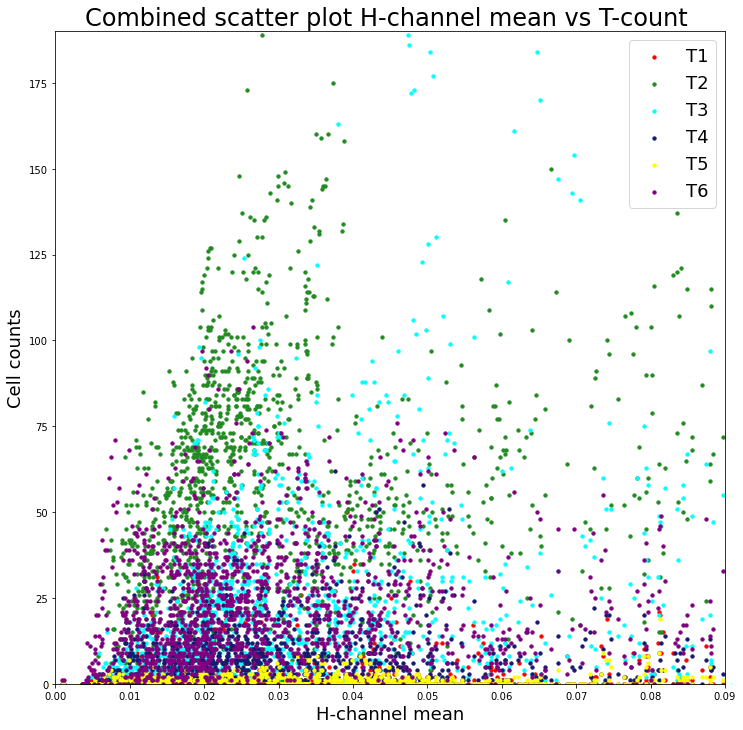

In [339]:
## v.
# scatter plot H vs. cell count for fold 1

df = Ydf[Ydf.fold == 1]  # fold dataframe
idxs = list(df.index)
titles = ['H-channel average vs. ' + t + ' count '  for t, name in T2name.items()]; titles.append("total count vs. H-channel average")
Ts = ['T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'Tot']
H_means = []
# find avg of H channel
for idx in idxs:
    imH = rgb2hed(X[idx])[:,:,0]
    mean = np.mean(imH)
    H_means.append(mean)

# scatter plots
f, a = plt.subplots(4, 2, figsize=(10,20))
for column in range(7):
    r, c =  column % 4, column // 4
    R = stats.pearsonr(H_means, df.iloc[:,column])[0]
    a[r, c].scatter(H_means, df.iloc[:,column],marker='.')
    # a[column].set_ylim((0,ranges[column]))
    a[r, c].set_title(titles[column])
    a[r, c].set_xlabel("H-channel mean")
    a[r, c].set_ylabel(Ts[column] + ' count')
    a[r, c].text(0.64, 0.93, 'PearsonCoef: ' + str(round(R,3)), transform=a[r, c].transAxes)


a[3,1].axis('off')
f.tight_layout(h_pad=2)
plt.show()

# plotting a compound scatter plot with colors
f, a = plt.subplots(1, 1, figsize=(12,12))
Ts = ['T1', 'T2', 'T3', 'T4', 'T5', 'T6']
cols = ['red', 'forestgreen', 'cyan', 'midnightblue', 'yellow', 'purple']
for column in range(6):
    a.scatter(H_means, df.iloc[:,column], color=cols[column], s=11, label=Ts[column])
    a.set_title("Combined scatter plot H-channel mean vs T-count ", fontsize=24)
    a.set_xlim((0,0.09)); a.set_ylim((0,190))
    a.set_xlabel("H-channel mean", fontsize=18)
    a.set_ylabel('Cell counts', fontsize=18)

plt.legend(fontsize=18)
plt.show()

---
## Question 2: (Feature Extraction and Classical Regression)

Extract features from a given image. Specifically, calculate the:
&emsp; a. average of the “H”, red, green and blue channels
&emsp; b. variance of the “H”, red, green and blue channels
&emsp; c. Any other features

i. &emsp; Plot the scatter plot and calculate the correlation coefficient of each feature in Q(2i,a-c) vs. the target variable (cell count) across all images. Which features do you think are important? Give your reasoning.
* features which have higher correlation coefficient (both negative and positive) are more important than the ones which have the correlation coefficient close to zero. This is because the correlation coefficients signify that the particular feature influences the target variable. We are interested in features which impact the total count and we want to drop features which do not have much influence upon the total count.
* Features with the highest positive correlation are: edge-R-channel mean (0.69), edge-G-channel mean (0.593), edge-B-channel mean(0.578) and edge-H-channel mean (0.571)
* Features with the highest negative correlation are: G-channel mean (-0.58), R-channel mean (-0.488), B-channel mean (-0.468)
* It is not surprising that edge features (both mean and variance) have high positive correlation with total cell count because the more edges we see in the image, the more objects we expect to see (and higher mean means lot of edges and similarly more edges we see, more variance we see). The opposite is also true: if we will have a pure black image, there would be no edges and hence the mean (and variance) would be very low and so will be the cell count.
* The fact that colour-channel mean is negatively correlated with the total count is also quite intuitive, because the highest possible mean of the red-channel would mean purely red image which would have very low cell count and same goes for other colors
* The surprising outcome of my analysis is that PC1 obtained from the PCA entails the same information as the channel mean of the respective channel. This is an important observation because it seems that adding this feature in the model only adds redundant information. Hence in theory the PCA was not very useful with respect to regression models of total cell count.
* Another observation is that the D-channel is the least correlated with overall cell count because in respect to almost all features (mean, var, edge var, PC1) it ended up being 'uncorellated' with the overall cell count. Hence this channel seems to be almost a completely irrelevant feature with respect to our regression problem.
* Overall, the edge features seem to be very important and they might potentially improve the the regression model significantly compared to the other features.

ii.&emsp; Try the following regression models with the features used in part-I. Plot the scatter plot between true and predicted counts for each type of regression model for the test data. Also, report your prediction performance in terms of RMSE, Pearson Correlation Coefficient, Spearman Correlation Coefficient and R2 score on the test data.
&emsp;&emsp; a. Ordinary Least Squares (OLS) regression  -> RMSE: 34.305, Pearson:0.780, Spearman:0.772, R-squared:0.515
&emsp;&emsp; b. Support Vector Regression &emsp;&emsp;&emsp;&emsp;&emsp;&emsp; -> RMSE: 31.130 , Pearson:0.818, Spearman:0.805, R-squared:0.601



In [71]:
## i.
# extracting means and variances for each image
feature_df = Ydf.copy()       # init the feature dataframe
feature_df['ChannelMeans'] = list(np.zeros((len(feature_df),6), dtype=np.float32)) # channel mean dataframe columns [R,G,B,H,E,D]
feature_df['ChannelVar'] = list(np.zeros((len(feature_df),6), dtype=np.float32))   # channel variance dataframe columns [R,G,B,H,E,D]
feature_df['EdgeMeans'] = list(np.zeros((len(feature_df),6), dtype=np.float32)) # edge mean dataframe columns [R,G,B,H,E,D]
feature_df['EdgeVar'] = list(np.zeros((len(feature_df),6), dtype=np.float32))   # edge variance dataframe columns [R,G,B,H,E,D]
feature_df['PCA1'] = list(np.zeros((len(feature_df),6), dtype=np.float32))   # PCA1 dataframe columns [R,G,B,H,E,D]

# extracting indexes
idxs = list(feature_df.index)      # get the image indices
df_train = Ydf[Ydf.fold <= 2]      # folds 1,2 dataframe
df_test = Ydf[Ydf.fold == 3]       # folds 1,2 dataframe
idxs_train = list(df_train.index)  # indexes of train imgs
idxs_test = list(df_test.index)    # indexes of test imgs
X_train = np.array([X[i] / 255 for i in idxs_train], dtype=np.float32)
HED_train = np.array([rgb2hed(X[i]) for i in idxs_train], dtype=np.float32)
HED_train = np.array([ (im - np.min(im))/np.max(im) for im in HED_train], dtype=np.float32)

# initialise the PCA
X_R = X_train[:,:,:,0].reshape(len(X_train),256*256)
X_G = X_train[:,:,:,1].reshape(len(X_train),256*256)
X_B = X_train[:,:,:,2].reshape(len(X_train),256*256)
X_H = HED_train[:,:,:,0].reshape(len(HED_train),256*256)
X_E = HED_train[:,:,:,1].reshape(len(HED_train),256*256)
X_D = HED_train[:,:,:,2].reshape(len(HED_train),256*256)
pcaR = IncrementalPCA(n_components=2, batch_size=100)
pcaG = IncrementalPCA(n_components=2, batch_size=100)
pcaB = IncrementalPCA(n_components=2, batch_size=100)
pcaH = IncrementalPCA(n_components=2, batch_size=100)
pcaE = IncrementalPCA(n_components=2, batch_size=100)
pcaD = IncrementalPCA(n_components=2, batch_size=100)
pcaR.fit(X_R); pcaG.fit(X_G); pcaB.fit(X_B)
pcaR.fit(X_H); pcaG.fit(X_E); pcaB.fit(X_D)
del HED_train; del X_train  # free up the memory


# loop through all images
for i in idxs:
    if i % 100 == 0:
        print(i)
    imRGB = X[i]
    imHED = rgb2hed(imRGB)

    imRGB = np.array(imRGB / 255, dtype=np.float32)           # 'normalize' the RGB image
    imHED = np.array((imHED - np.min(imHED)) / np.max(imHED), dtype=np.float32) # 'normalize' the HED image
    imH, imE, imD = imHED[:,:,0], imHED[:,:,1], imHED[:,:,2]

    # get the means of each channel
    meanR = np.mean(imRGB[:,:,0])
    meanG = np.mean(imRGB[:,:,1])
    meanB = np.mean(imRGB[:,:,2])
    meanH = np.mean(imH)
    meanE = np.mean(imE)
    meanD = np.mean(imD)

    # get the variances  of each channel
    varR = np.var(imRGB[:,:,0])
    varG = np.var(imRGB[:,:,1])
    varB = np.var(imRGB[:,:,2])
    varH = np.var(imH)
    varE = np.var(imE)
    varD = np.var(imD)

    # additional features: edge channels
    im_edgeR = filters.sobel(imRGB[:,:,0])
    im_edgeG = filters.sobel(imRGB[:,:,1])
    im_edgeB = filters.sobel(imRGB[:,:,2])
    im_edgeH = filters.sobel(imH)
    im_edgeE = filters.sobel(imE)
    im_edgeD = filters.sobel(imD)

    # edge channels means
    mean_eR = np.mean(im_edgeR)
    mean_eG = np.mean(im_edgeG)
    mean_eB = np.mean(im_edgeB)
    mean_eH = np.mean(im_edgeH)
    mean_eE = np.mean(im_edgeE)
    mean_eD = np.mean(im_edgeD)

    # edge channels variances
    var_eR = np.var(im_edgeR)
    var_eG = np.var(im_edgeG)
    var_eB = np.var(im_edgeB)
    var_eH = np.var(im_edgeH)
    var_eE = np.var(im_edgeE)
    var_eD = np.var(im_edgeD)

    # additional features: PCA1
    PC1_R = pcaR.transform([imRGB[:,:,0].reshape(256*256)])[0][0]
    PC1_G = pcaG.transform([imRGB[:,:,1].reshape(256*256)])[0][0]
    PC1_B = pcaB.transform([imRGB[:,:,2].reshape(256*256)])[0][0]
    PC1_H = pcaR.transform([imH.reshape(256*256)])[0][0]
    PC1_E = pcaG.transform([imE.reshape(256*256)])[0][0]
    PC1_D = pcaB.transform([imD.reshape(256*256)])[0][0]


    means = [meanR, meanG, meanB, meanH, meanE, meanD]; means = [round(m, 6) for m in means]
    vars = [varR, varG, varB, varH, varE, varD]; vars = [round(v,7) for v in vars]

    means_edge = [mean_eR, mean_eG, mean_eB, mean_eH, mean_eE, mean_eD]; means_edge = [round(m, 7) for m in means_edge]
    vars_edge = [var_eR, var_eG, var_eB, var_eH, var_eE, var_eD]; vars_edge = [round(v,8) for v in vars_edge]

    # update the feature dataframe
    feature_df.loc[i, 'ChannelMeans'][0:6] = means[0:6]
    feature_df.loc[i, 'ChannelVar'][0:6]   = vars[0:6]
    feature_df.loc[i, 'EdgeMeans'][0:6] = means_edge[0:6]
    feature_df.loc[i, 'EdgeVar'][0:6]   = vars_edge[0:6]
    feature_df.loc[i, 'PCA1'][0:6] = [PC1_R ,PC1_G ,PC1_B ,PC1_H ,PC1_E ,PC1_D]

# saving the dataframe
# feature_df.to_csv("features_dataframe.csv")

# extracting the training and test set
feature_train = feature_df[feature_df.fold <= 2]      # folds 1,2 dataframe
feature_test = feature_df[feature_df.fold == 3]       # fold 3 dataframe
feature_df

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900


,T1,T2,T3,T4,T5,T6,total,fold,ChannelMeans,ChannelVar,EdgeMeans,EdgeVar,PCA1
0,0,117,0,0,0,0,117,3,"[0.775287, 0.666784, 0.864555, 0.233085, 0.157...","[0.0204742, 0.0288507, 0.0074125, 0.0095777, 0...","[0.0914847, 0.1002382, 0.0678861, 0.0585233, 0...","[0.00505353, 0.0058937, 0.00230951, 0.00290425...","[135.4175, 119.933235, 180.17522, -3.3469942, ..."
1,0,95,1,0,0,8,104,3,"[0.794013, 0.691662, 0.873952, 0.234881, 0.168...","[0.0217987, 0.0335098, 0.0078382, 0.0095138, 0...","[0.0851608, 0.0934618, 0.0630601, 0.052857, 0....","[0.00509332, 0.00599376, 0.00237556, 0.0027405...","[140.24007, 126.317986, 182.58493, -2.906567, ..."
2,0,172,3,0,0,2,177,3,"[0.773916, 0.667299, 0.862993, 0.246465, 0.181...","[0.023675, 0.0354886, 0.0082387, 0.0077928, 0....","[0.0867146, 0.0927609, 0.0644325, 0.0483208, 0...","[0.00538372, 0.00601338, 0.00257216, 0.0021890...","[135.00354, 120.07065, 179.78394, 0.11316484, ..."
3,0,56,0,0,0,10,66,3,"[0.807823, 0.70842, 0.878354, 0.211908, 0.1485...","[0.0220868, 0.0375012, 0.0078989, 0.0106359, 0...","[0.0765607, 0.0854595, 0.0575807, 0.0503986, 0...","[0.00446798, 0.00548544, 0.00222698, 0.0025494...","[143.69215, 130.44019, 183.68468, -8.729073, -..."
4,0,169,7,0,0,0,176,3,"[0.738723, 0.605632, 0.83998, 0.305215, 0.2247...","[0.0189696, 0.0252653, 0.0082589, 0.0086717, 0...","[0.0836248, 0.0898643, 0.0701394, 0.0524838, 0...","[0.00395698, 0.00453959, 0.00237799, 0.0021012...","[126.01911, 104.26735, 173.89485, 15.137869, 6..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4976,0,22,17,8,2,50,99,3,"[0.833618, 0.676521, 0.851176, 0.14907, 0.1339...","[0.0148288, 0.025066, 0.0089332, 0.0104357, 0....","[0.0776883, 0.0899764, 0.0691011, 0.0583442, 0...","[0.00401152, 0.005168, 0.00266884, 0.00325574,...","[150.35205, 122.391594, 176.7407, -24.853659, ..."
4977,0,78,9,0,0,9,96,3,"[0.809485, 0.649724, 0.820723, 0.180423, 0.161...","[0.0271626, 0.0524049, 0.0162666, 0.015997, 0....","[0.0660378, 0.0717327, 0.056605, 0.0486465, 0....","[0.00447322, 0.00512026, 0.002878, 0.00317198,...","[144.24411, 115.709854, 168.92288, -16.84418, ..."
4978,0,106,1,0,0,0,107,3,"[0.792709, 0.653538, 0.819992, 0.228364, 0.170...","[0.0321468, 0.0628606, 0.018634, 0.0332671, 0....","[0.0576428, 0.0627789, 0.0500692, 0.0591832, 0...","[0.00313064, 0.00365596, 0.00212226, 0.0040743...","[139.81184, 116.32666, 168.71782, -4.4939137, ..."
4979,0,80,8,1,0,14,103,3,"[0.793137, 0.646565, 0.818171, 0.208738, 0.167...","[0.0323869, 0.0616531, 0.0191789, 0.0217015, 0...","[0.0725343, 0.0785888, 0.0621027, 0.0591412, 0...","[0.00542561, 0.00651203, 0.00360056, 0.0043655...","[140.00262, 114.78561, 168.2604, -9.584246, -7..."


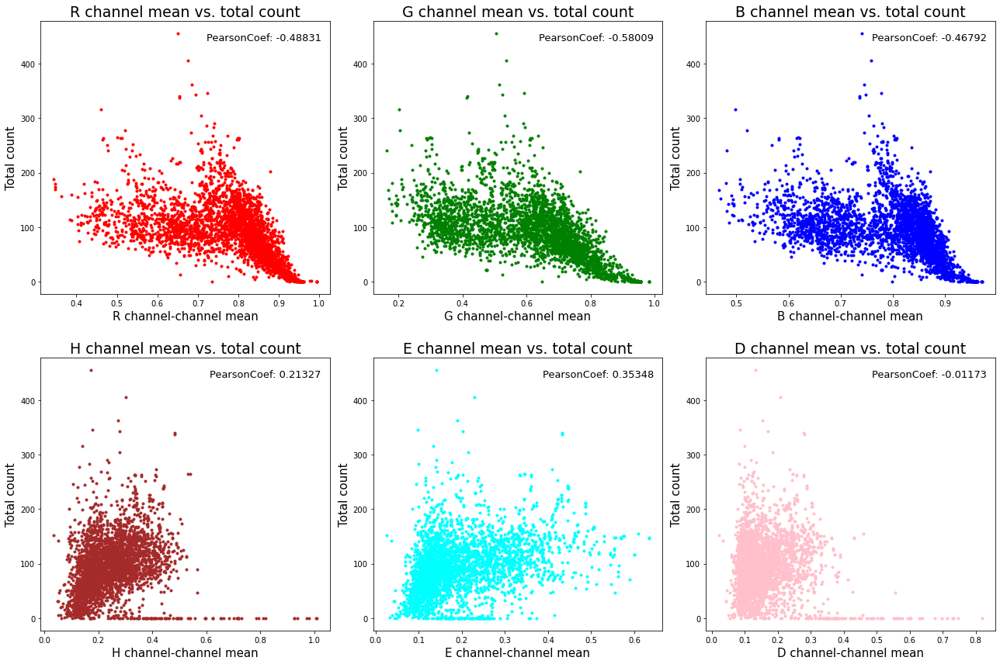

----------------------------------------------------------------------------------------------------


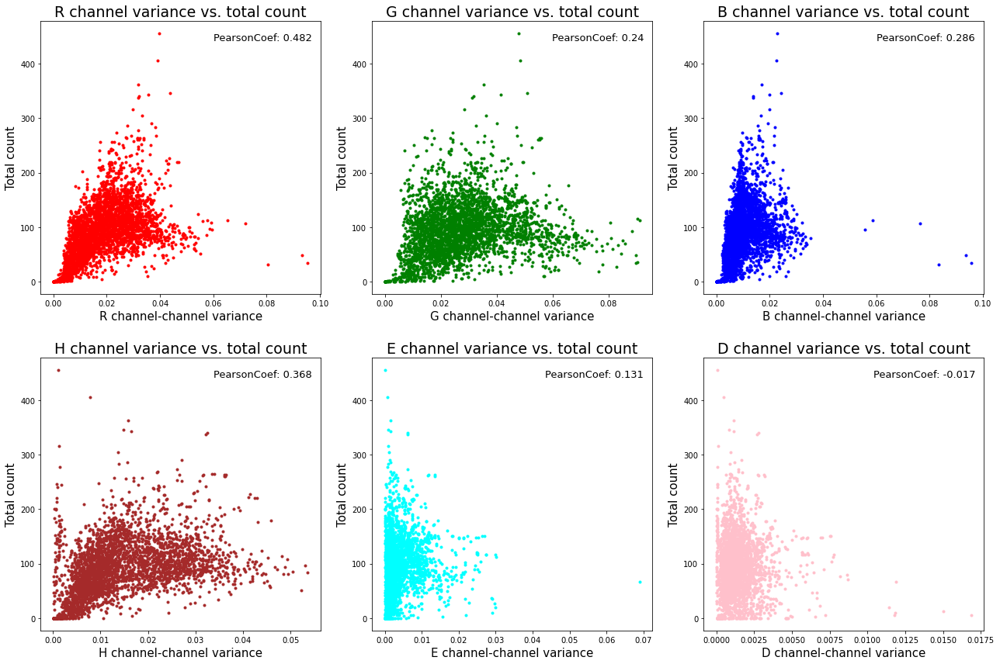

----------------------------------------------------------------------------------------------------


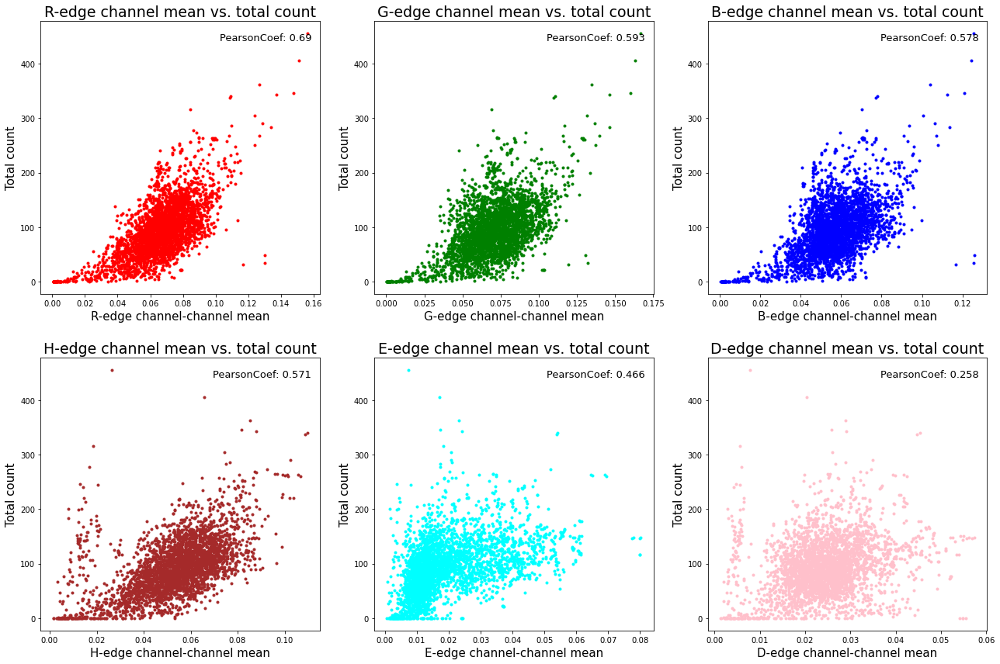

----------------------------------------------------------------------------------------------------


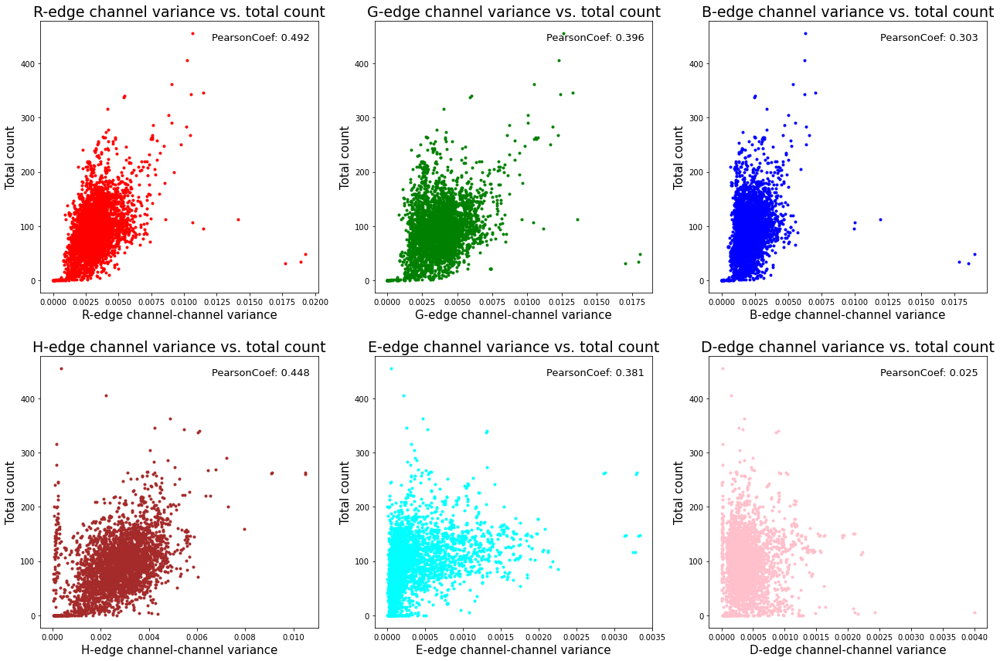

----------------------------------------------------------------------------------------------------


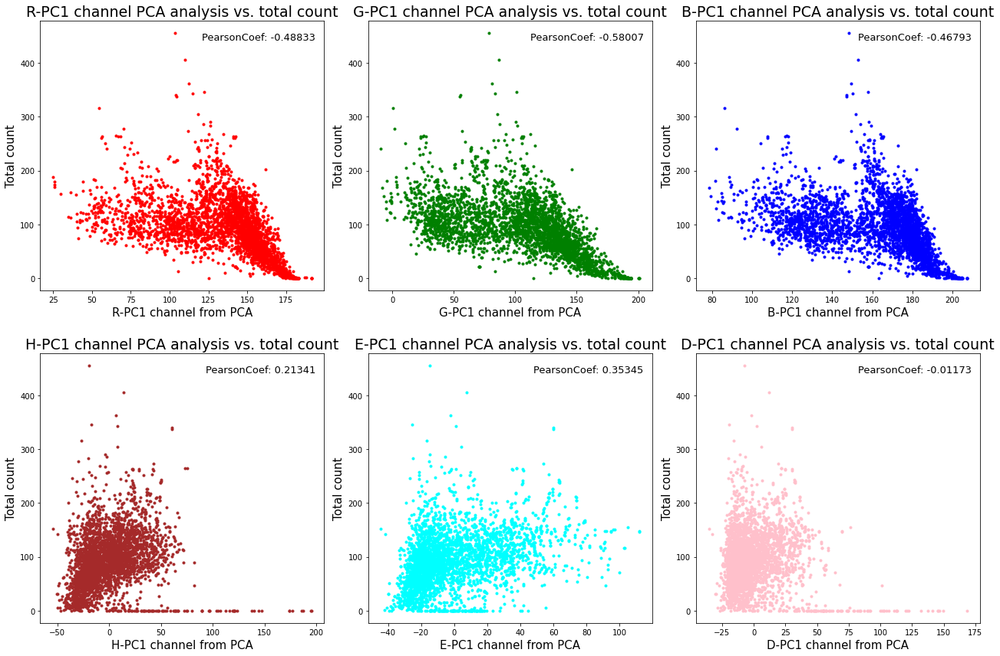

In [129]:
## plotting the scatter plots

# scatter plot for ChannelMeans
f, a = plt.subplots(2, 3, figsize=(18,12))
total_vec = feature_train.loc[:,'total']
channels_list = ['R', 'G', 'B', 'H', 'E', 'D']; channels_list = [n + ' channel' for n in channels_list]
cols = ['red', 'green', 'blue', 'brown', 'cyan', 'pink']
for channel in range(6):
    r, c =  channel // 3, channel % 3
    title = channels_list[channel] + ' mean vs. total count'
    channel_vec = [row[channel] for row in feature_train.loc[:,'ChannelMeans']]

    R = stats.pearsonr(channel_vec, total_vec)[0]
    a[r, c].scatter(channel_vec, total_vec, marker='.', color=cols[channel])
    # a[column].set_ylim((0,ranges[column]))
    a[r, c].set_title(title, fontsize=19)
    a[r, c].set_xlabel(channels_list[channel] + "-channel mean", fontsize=15)
    a[r, c].set_ylabel('Total count', fontsize=15)
    a[r, c].text(0.97, 0.93,'PearsonCoef: '+str(round(R,5)), horizontalalignment='right', transform=a[r, c].transAxes, fontsize=13)

plt.tight_layout(h_pad=2.5)
plt.show()
print('-'*100)

# scatter plot for ChannelVars
f, a = plt.subplots(2, 3, figsize=(18,12))
total_vec = feature_train.loc[:,'total']
channels_list = ['R', 'G', 'B', 'H', 'E', 'D']; channels_list = [n + ' channel' for n in channels_list]
cols = ['red', 'green', 'blue', 'brown', 'cyan', 'pink']
for channel in range(6):
    r, c =  channel // 3, channel % 3
    title = channels_list[channel] + ' variance vs. total count'
    channel_vec = [row[channel] for row in feature_train.loc[:,'ChannelVar']]

    R = stats.pearsonr(channel_vec, total_vec)[0]
    a[r, c].scatter(channel_vec, total_vec, marker='.', color=cols[channel])
    # a[column].set_ylim((0,ranges[column]))
    a[r, c].set_title(title, fontsize=19)
    a[r, c].set_xlabel(channels_list[channel] + "-channel variance", fontsize=15)
    a[r, c].set_ylabel('Total count', fontsize=15)
    a[r, c].text(0.97, 0.93,'PearsonCoef: '+str(round(R,3)), horizontalalignment='right', transform=a[r, c].transAxes, fontsize=13)

plt.tight_layout(h_pad=2.5)
plt.show()
print('-'*100)


# scatter plot for EdgeMeans
f, a = plt.subplots(2, 3, figsize=(18,12))
total_vec = feature_train.loc[:,'total']
channels_list = ['R-edge', 'G-edge', 'B-edge', 'H-edge', 'E-edge', 'D-edge']; channels_list = [n + ' channel' for n in channels_list]
cols = ['red', 'green', 'blue', 'brown', 'cyan', 'pink']
for channel in range(6):
    r, c =  channel // 3, channel % 3
    title = channels_list[channel] + ' mean vs. total count'
    channel_vec = [row[channel] for row in feature_train.loc[:,'EdgeMeans']]

    R = stats.pearsonr(channel_vec, total_vec)[0]
    a[r, c].scatter(channel_vec, total_vec, marker='.', color=cols[channel])
    # a[column].set_ylim((0,ranges[column]))
    a[r, c].set_title(title, fontsize=19)
    a[r, c].set_xlabel(channels_list[channel] + "-channel mean", fontsize=15)
    a[r, c].set_ylabel('Total count', fontsize=15)
    a[r, c].text(0.97, 0.93,'PearsonCoef: '+str(round(R,3)), horizontalalignment='right', transform=a[r, c].transAxes, fontsize=13)

plt.tight_layout(h_pad=2.5)
plt.show()
print('-'*100)


# scatter plot for EdgeVars
f, a = plt.subplots(2, 3, figsize=(18,12))
total_vec = feature_train.loc[:,'total']
channels_list = ['R-edge', 'G-edge', 'B-edge', 'H-edge', 'E-edge', 'D-edge']; channels_list = [n + ' channel' for n in channels_list]
cols = ['red', 'green', 'blue', 'brown', 'cyan', 'pink']
for channel in range(6):
    r, c =  channel // 3, channel % 3
    title = channels_list[channel] + ' variance vs. total count'
    channel_vec = [row[channel] for row in feature_train.loc[:,'EdgeVar']]

    R = stats.pearsonr(channel_vec, total_vec)[0]
    a[r, c].scatter(channel_vec, total_vec, marker='.', color=cols[channel])
    # a[column].set_ylim((0,ranges[column]))
    a[r, c].set_title(title, fontsize=19)
    a[r, c].set_xlabel(channels_list[channel] + "-channel variance", fontsize=15)
    a[r, c].set_ylabel('Total count', fontsize=15)
    a[r, c].text(0.97, 0.93,'PearsonCoef: '+str(round(R,3)), horizontalalignment='right', transform=a[r, c].transAxes, fontsize=13)

plt.tight_layout(h_pad=2.5)
plt.show()
print('-'*100)

# scatter plot for PCA1
f, a = plt.subplots(2, 3, figsize=(18,12))
total_vec = feature_train.loc[:,'total']
channels_list = ['R-PC1', 'G-PC1', 'B-PC1', 'H-PC1', 'E-PC1', 'D-PC1']; channels_list = [n + ' channel' for n in channels_list]
cols = ['red', 'green', 'blue', 'brown', 'cyan', 'pink']
for channel in range(6):
    r, c =  channel // 3, channel % 3
    title = channels_list[channel] + ' PCA analysis vs. total count'
    channel_vec = [row[channel] for row in feature_train.loc[:,'PCA1']]

    R = stats.pearsonr(channel_vec, total_vec)[0]
    a[r, c].scatter(channel_vec, total_vec, marker='.', color=cols[channel])
    # a[column].set_ylim((0,ranges[column]))
    a[r, c].set_title(title, fontsize=19)
    a[r, c].set_xlabel(channels_list[channel] + " from PCA", fontsize=15)
    a[r, c].set_ylabel('Total count', fontsize=15)
    a[r, c].text(0.97, 0.93,'PearsonCoef: '+str(round(R,5)), horizontalalignment='right', transform=a[r, c].transAxes, fontsize=13)

plt.tight_layout(h_pad=2.5)
plt.show()

Linear regression: 			 RMSE: 1176.838, Pearson:0.780, Spearman:0.772, R-squared:0.515
Support Vector Regression: 	 RMSE: 969.085, Pearson:0.818, Spearman:0.805, R-squared:0.601


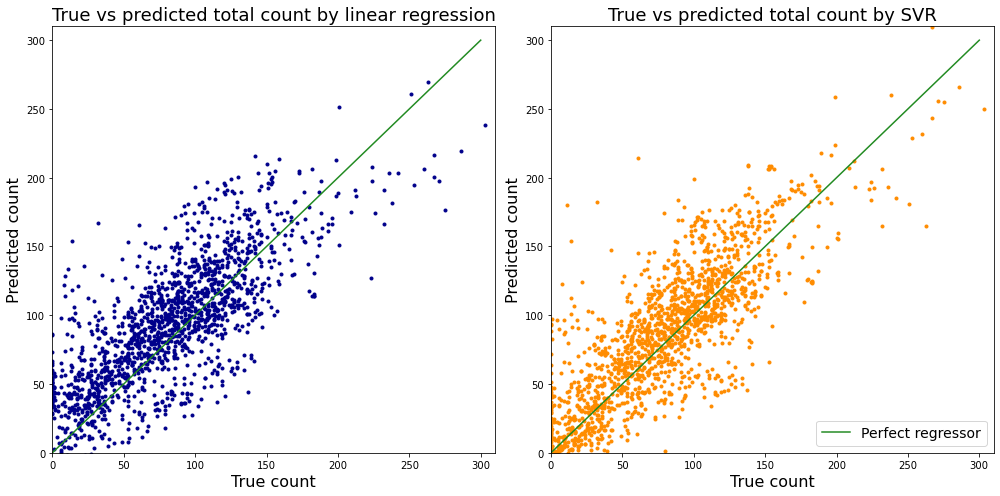

In [199]:
## ii. linear regression model

# prepare the dataframe
    # -> 0-R, 1-G, 2-B, 3-H, 4-E, 5-D
    # -> m - channel mean, v - channel var, me - edge mean, ve - edge variance, pca -> PC1 component
df = feature_train.iloc[:,0:6].copy()
df['m0'] = [row[0] for row in feature_train.loc[:,'ChannelMeans']]
df['m1'] = [row[1] for row in feature_train.loc[:,'ChannelMeans']]
df['m2'] = [row[2] for row in feature_train.loc[:,'ChannelMeans']]
df['m3'] = [row[3] for row in feature_train.loc[:,'ChannelMeans']]
df['m4'] = [row[4] for row in feature_train.loc[:,'ChannelMeans']]
df['m5'] = [row[5] for row in feature_train.loc[:,'ChannelMeans']]

df['v0'] = [row[0] for row in feature_train.loc[:,'ChannelVar']]
df['v1'] = [row[1] for row in feature_train.loc[:,'ChannelVar']]
df['v2'] = [row[2] for row in feature_train.loc[:,'ChannelVar']]
df['v3'] = [row[3] for row in feature_train.loc[:,'ChannelVar']]
df['v4'] = [row[4] for row in feature_train.loc[:,'ChannelVar']]
df['v5'] = [row[5] for row in feature_train.loc[:,'ChannelVar']]

df['me0'] = [row[0] for row in feature_train.loc[:,'EdgeMeans']]
df['me1'] = [row[1] for row in feature_train.loc[:,'EdgeMeans']]
df['me2'] = [row[2] for row in feature_train.loc[:,'EdgeMeans']]
df['me3'] = [row[3] for row in feature_train.loc[:,'EdgeMeans']]
df['me4'] = [row[4] for row in feature_train.loc[:,'EdgeMeans']]
df['me5'] = [row[5] for row in feature_train.loc[:,'EdgeMeans']]

df['ve0'] = [row[0] for row in feature_train.loc[:,'EdgeVar']]
df['ve1'] = [row[1] for row in feature_train.loc[:,'EdgeVar']]
df['ve2'] = [row[2] for row in feature_train.loc[:,'EdgeVar']]
df['ve3'] = [row[3] for row in feature_train.loc[:,'EdgeVar']]
df['ve4'] = [row[4] for row in feature_train.loc[:,'EdgeVar']]
df['ve5'] = [row[5] for row in feature_train.loc[:,'EdgeVar']]

df['pca0'] = [row[0] for row in feature_train.loc[:,'PCA1']]
df['pca1'] = [row[1] for row in feature_train.loc[:,'PCA1']]
df['pca2'] = [row[2] for row in feature_train.loc[:,'PCA1']]
df['pca3'] = [row[3] for row in feature_train.loc[:,'PCA1']]
df['pca4'] = [row[4] for row in feature_train.loc[:,'PCA1']]
df['pca5'] = [row[5] for row in feature_train.loc[:,'PCA1']]
df = df.iloc[:,6:]

df_test = feature_test.iloc[:,0:6].copy()
df_test['m0'] = [row[0] for row in feature_test.loc[:,'ChannelMeans']]
df_test['m1'] = [row[1] for row in feature_test.loc[:,'ChannelMeans']]
df_test['m2'] = [row[2] for row in feature_test.loc[:,'ChannelMeans']]
df_test['m3'] = [row[3] for row in feature_test.loc[:,'ChannelMeans']]
df_test['m4'] = [row[4] for row in feature_test.loc[:,'ChannelMeans']]
df_test['m5'] = [row[5] for row in feature_test.loc[:,'ChannelMeans']]

df_test['v0'] = [row[0] for row in feature_test.loc[:,'ChannelVar']]
df_test['v1'] = [row[1] for row in feature_test.loc[:,'ChannelVar']]
df_test['v2'] = [row[2] for row in feature_test.loc[:,'ChannelVar']]
df_test['v3'] = [row[3] for row in feature_test.loc[:,'ChannelVar']]
df_test['v4'] = [row[4] for row in feature_test.loc[:,'ChannelVar']]
df_test['v5'] = [row[5] for row in feature_test.loc[:,'ChannelVar']]

df_test['me0'] = [row[0] for row in feature_test.loc[:,'EdgeMeans']]
df_test['me1'] = [row[1] for row in feature_test.loc[:,'EdgeMeans']]
df_test['me2'] = [row[2] for row in feature_test.loc[:,'EdgeMeans']]
df_test['me3'] = [row[3] for row in feature_test.loc[:,'EdgeMeans']]
df_test['me4'] = [row[4] for row in feature_test.loc[:,'EdgeMeans']]
df_test['me5'] = [row[5] for row in feature_test.loc[:,'EdgeMeans']]

df_test['ve0'] = [row[0] for row in feature_test.loc[:,'EdgeVar']]
df_test['ve1'] = [row[1] for row in feature_test.loc[:,'EdgeVar']]
df_test['ve2'] = [row[2] for row in feature_test.loc[:,'EdgeVar']]
df_test['ve3'] = [row[3] for row in feature_test.loc[:,'EdgeVar']]
df_test['ve4'] = [row[4] for row in feature_test.loc[:,'EdgeVar']]
df_test['ve5'] = [row[5] for row in feature_test.loc[:,'EdgeVar']]

df_test['pca0'] = [row[0] for row in feature_test.loc[:,'PCA1']]
df_test['pca1'] = [row[1] for row in feature_test.loc[:,'PCA1']]
df_test['pca2'] = [row[2] for row in feature_test.loc[:,'PCA1']]
df_test['pca3'] = [row[3] for row in feature_test.loc[:,'PCA1']]
df_test['pca4'] = [row[4] for row in feature_test.loc[:,'PCA1']]
df_test['pca5'] = [row[5] for row in feature_test.loc[:,'PCA1']]
df_test = df_test.iloc[:,6:]


x = df.to_numpy(dtype=np.float32)   # all features in a numpy array 5 x 6 = 30 features
y = feature_train.loc[:,'total']    # the target vector: total vec
column_names = list(df.columns)     # list of all names of features

## LINEAR REGRESSION
model = LinearRegression()
model.fit(x,y)

coefficients = [(column_names[i], c) for i, c in enumerate(model.coef_)]
coefficients = sorted(coefficients, key=lambda data: data[1], reverse=True)
#print(coefficients)

# get prediction for the 3rd fold
y_pred = model.predict(df_test)
y_true = feature_test.loc[:,'total']

# calculate all the metrics
m1 = np.sqrt(mean_squared_error(y_true, y_pred))# RMSE
m2 = stats.pearsonr(y_true, y_pred)[0]          # Pearson
m3 = stats.spearmanr(y_true, y_pred)[0]         # Spearman
m4 = r2_score(y_true, y_pred)                   # R-squared

print(f"Linear regression: \t\t\t RMSE: {m1:.3f}, Pearson:{m2:.3f}, Spearman:{m3:.3f}, R-squared:{m4:.3f}")

# plot the scatter plot true vs. predicted
f, a = plt.subplots(1, 2, figsize=(14,7))

a[0].scatter(y_true, y_pred, marker='.', color='darkblue')
line = Line2D([0,300], [0,300], color='forestgreen', label='Perfect regressor')
a[0].add_line(line)
a[0].set_xlim((0,310)); a[0].set_ylim((0,310))
a[0].set_title("True vs predicted total count by linear regression", fontsize=18)
a[0].set_xlabel('True count', fontsize=16)
a[0].set_ylabel('Predicted count', fontsize=16)
#plt.legend(fontsize=13)


## SVR - SUPPOR VECTOR REGRESSION
modelSVR = make_pipeline(StandardScaler(), SVR(C=1000.0 , epsilon=0.1, kernel='rbf'))
modelSVR.fit(x,y)

y_predSVR = modelSVR.predict(df_test)
y_trueSVR = feature_test.loc[:,'total']

# calculate all the metrics
m1 = np.sqrt(mean_squared_error(y_trueSVR, y_predSVR))# RMSE
m2 = stats.pearsonr(y_trueSVR, y_predSVR)[0]          # Pearson
m3 = stats.spearmanr(y_trueSVR, y_predSVR)[0]         # Spearman
m4 = r2_score(y_trueSVR, y_predSVR)                   # R-squared
print(f"Support Vector Regression: \t RMSE: {m1:.3f}, Pearson:{m2:.3f}, Spearman:{m3:.3f}, R-squared:{m4:.3f}")

# plot the scatter plot true vs. predicted for SVR
a[1].scatter(y_trueSVR, y_predSVR, marker='.', color='darkorange')
line = Line2D([0,300], [0,300], color='forestgreen', label='Perfect regressor')
a[1].add_line(line)
a[1].set_xlim((0,310)); a[1].set_ylim((0,310))
a[1].set_title("True vs predicted total count by SVR", fontsize=18)
a[1].set_xlabel('True count', fontsize=16)
a[1].set_ylabel('Predicted count', fontsize=16)
plt.legend(fontsize=14, loc='lower right')

plt.tight_layout(h_pad=2)
plt.show()

---
## Question 3: Using Convolutional Neural Networks
a. &emsp; Use a convolutional neural network to solve this problem in much the same was as in part (ii) of Question (2) (total number of cells as the output prediction variable). Develop an architecture of the neural network that takes an image directly as input and produces a count of the total number of cells. Choose any network structure as long as you can show that it gives good performance. You will be evaluated on the design of your machine learning model and final performance metrics. Try to get the best test performance you can.
* Report your results on the test examples by plotting the scatter plot between true and predicted counts on the test data.
* Report your results in terms of RMSE, Pearson Correlation Coefficient, Spearman Correlation Coefficient and R2 score.
* Include convergence plots in your submission showing how does loss change over training epochs.

b. &emsp; Use a convolutional neural network to predict the counts of 6 types of cells simultaneously given the image patch as input as well as the total number of cells (7 outputs in total). Choose any network structure as long as you can show that it gives good cross-validation performance.
* Report the results for the test fold for each cell type in the form of separate predicted-vs-actual count scatter plots (3 folds, 6 cell types and 1 as the total number of cells so 21 plots in total) using your optimal machine learning model
* report your results in terms of RMSE, Pearson Correlation Coefficient, Spearman Correlation Coefficient and R2 score for each cell type and the total number of cells.

In [ ]:
# clean the memory
try:
    del feature_test, feature_train, imRGB, imH, imE, imD, im_edgeB, im_edgeD, im_edgeE, im_edgeG, im_edgeH, im_edgeR
    del model, modelSVR, y_pred, y_true, y_predSVR, y_trueSVR
except:
    print("Variables already deleted.")

In [329]:
# extracting the datasets
df_train = Ydf[Ydf.fold <= 2]      # folds 1,2 dataframe
df_test = Ydf[Ydf.fold == 3]       # folds 1,2 dataframe
idxs_train = list(df_train.index)  # indexes of train imgs
idxs_test = list(df_test.index)    # indexes of train imgs


X_train = np.array([X[i] / 255 for i in idxs_train], dtype=np.float32)  # set of train images ~ (3373, 256, 256, 3)
X_test = np.array([X[i] / 255 for i in idxs_test], dtype=np.float32)    # set of test images  ~ (1608, 256, 256, 3)
y_train = np.array(df_train.loc[:,'total'])     # training labels ~ (3373,)
y_test = np.array(df_test.loc[:,'total'])       # testing labels ~ (1608,)

#X_train = X_train[0:500]###
#y_train = y_train[0:500]###

#print(X_train[0,0,0,0].dtype)

In [325]:
# auxiliary functions for Torch

# cuda settings
USE_CUDA = False
def cuda(v):
    if USE_CUDA:
        return v.cuda()
    return v

# auxiliary ftion for torch
def toTensor(v,dtype = torch.float,requires_grad = False):
    return cuda(Variable(v.clone().detach()).type(dtype).requires_grad_(requires_grad))

# auxiliary ftion for torch tensors
def toNumpy(v):
    if USE_CUDA:
        return v.detach().cpu().numpy()
    return v.detach().numpy()

# setup a random seed for reproducible results
def random_seed_setup(seed):
    torch.manual_seed(seed) #torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    torch.backends.cudnn.deterministic = True

# establish a Dataset class
class conic_dataset(Dataset):
    def __init__(self, numpy_array_features, numpy_array_labels):

        # adjusting the shape of the numpy arrays to (num_samples, num_channels, height, width)
        ns, h, w, nch = numpy_array_features.shape
        numpy_array_features = numpy_array_features.reshape((ns, nch, h, w))

        # convert them to torch tensors
        # numpy_array_features = numpy_array_features.astype(np.float32)
        # numpy_array_labels = numpy_array_labels.astype(np.int32)
        xs = torch.from_numpy(numpy_array_features)
        ys = torch.from_numpy(numpy_array_labels)
        self.x = toTensor(xs, dtype=torch.float32, requires_grad=False)
        self.y = toTensor(ys, dtype=torch.float32, requires_grad=False)
        self.n_samples = len(ys)
    def __getitem__(self, index):
        return self.x[index], self.y[index]
    def __len__(self):
        return self.n_samples
#train_val_dataset = conic_dataset(X_train, y_train)
#test_dataset = conic_dataset(X_test, y_test)

In [ ]:
# setting up a CNN

# Hyperparameters
#input_size = 100
#seq_len = 32
#n_layers = 1
n_classes = 1
hidden_size = 64
n_epochs = 10
batch_size = 128
learning_rate = 0.001
HYPER = {'n_epochs': n_epochs,'batch_size': batch_size,'learning_rate': learning_rate}

device = torch.device('cpu')  # setting up the device
random_seed_setup(123)        # setting up the seed

class ConvNet(nn.Module):
    def __init__(self, num_classes=n_classes):
        super(ConvNet, self).__init__()
        self.layer1_1 = nn.Sequential(
            nn.Conv2d(3, 10, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(10),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))

        self.layer1_2 = nn.Sequential(
            nn.Conv2d(3, 15, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(15),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))

        self.layer1_3 = nn.Sequential(
            nn.Conv2d(3, 5, kernel_size=10, stride=1, padding=5),
            nn.BatchNorm2d(5),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))


        self.layer2 = nn.Sequential(
            nn.Conv2d(10+15+5, 10, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(10),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))

        self.layer3 = nn.Sequential(
            nn.Conv2d(10, 20, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(20),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))

        self.layer4 = nn.Sequential(
            nn.Conv2d(20, 30, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(30),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=4, stride=4))

        self.fc1 = nn.Sequential(
            nn.Linear(8*8*30, hidden_size),
            nn.ReLU())

        self.fc2 = nn.Sequential(
            nn.Linear(hidden_size, n_classes))

    def forward(self, x):
        x1 = self.layer1_1(x)    # [batch_size, 10, 128, 128]

        x2 = self.layer1_2(x)    # [batch_size, 15, 128, 128]

        x3 = self.layer1_3(x)    # [batch_size, 5, 128, 128]

        out = torch.cat((x1, x2, x3), dim=1)   # [64, 30, 128, 128]

        out = self.layer2(out)   # [batch_size, 10, 64, 64]

        out = self.layer3(out)   # [batch_size, 5, 32, 32]

        out = self.layer4(out)   # [batch_size, 30, 8, 8]

        out = out.reshape(out.size(0), -1)  # [batch_size, 1920]

        out = self.fc1(out)  # [batch, hidden_size]

        out = self.fc2(out)  # [batch_size, 1]

        out = torch.squeeze(out)  # [batch_size]

        return out

model = ConvNet(num_classes=n_classes).to(device)
# loading preprocessed embedding file if it exists (embedding matrix, word to index map, embedding dictionary)
if os.path.isfile('---CNNmodel.pt'):  # loading the pytorch pretrained model
    model.load_state_dict(torch.load('CNNmodel.pt'))
else:  # we train the model

    # Loss and optimizer
    criterion = nn.MSELoss()  #  MSE loss implementation
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)



    train_val_dataset = conic_dataset(X_train, y_train)  # set up the train dataset
    train_dataset, dev_dataset = random_split(train_val_dataset,[0.85, 0.15])  # set up the train and dev dataset
    train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
    dev_loader = DataLoader(dataset=dev_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

    # Train the model
    L = []            # training loss history
    L_validation = [] # validation loss history
    i_val = []        # validation indexes
    total_step = len(train_loader)
    for epoch in range(n_epochs):
        for i, (images, labels) in enumerate(train_loader):
            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = torch.sqrt(criterion(outputs, labels))  # using RMSE loss
            L.append(loss.item())

            # Reset gradient, backpropagation and optimization step
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            if (i+1) % 10 == 0:
                print (f"Epoch [{epoch+1}/{n_epochs}], Step [{i+1}/{total_step}], Loss: {loss.item():.4f}")

        # Do the validation error analysis every epoch
        with torch.no_grad():
            ys_true, ys_pred, L_val = [], [], []
            for  j, (xs, ys) in enumerate(dev_loader):
                preds = model(xs)
                loss = torch.sqrt(criterion(preds, ys))
                L_val.append(loss)
                ys_true.append(ys)
                ys_pred.append(preds)
            ys_true = torch.cat(ys_true)
            ys_pred = torch.cat(ys_pred)
            mean_val_loss = torch.tensor(L_val).mean()
            pearsonCoeff = stats.pearsonr(ys_true.detach().numpy(), ys_pred.detach().numpy())[0]
            L_validation.append(mean_val_loss)   # append the validation loss vector
            i_val.append((epoch + 1) * (i + 1))  # record the iteration number for plotting

        # Save the model checkpoint
        if epoch > 0:
            filename = './tempfolder/model_E' + str(epoch + 1) + '.pt'
            torch.save(model.state_dict(), filename)

    # reporting the train and validation performance every fold
    [print(f"{p}:{n}  " , end='' ) for (p,n) in HYPER.items()]; print('')
    print(f"  Train loss: \t {L[-1]:.3f} \t\tValidation loss: {L_validation[-1]:.3f}  \t Pearson:  {pearsonCoeff:.3f} ")
    plt.figure(figsize=(12,8)); plt.plot(L, label="train loss");plt.xlabel('iterations');plt.ylabel('RMSE');plt.grid()
    plt.plot(i_val, L_validation, 'o:', label="val loss"); plt.legend(); plt.show()



Epoch [1/10], Step [10/22], Loss: 64.0137
Epoch [1/10], Step [20/22], Loss: 32.6878
Epoch [2/10], Step [10/22], Loss: 25.9138
Epoch [2/10], Step [20/22], Loss: 26.4550
Epoch [3/10], Step [10/22], Loss: 24.3615
Epoch [3/10], Step [20/22], Loss: 28.8931
Epoch [4/10], Step [10/22], Loss: 30.2139
Epoch [4/10], Step [20/22], Loss: 29.8727
Epoch [5/10], Step [10/22], Loss: 33.6400


384 384
0.6875865266625538


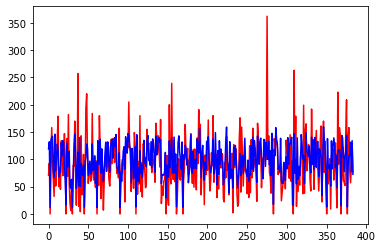

In [339]:
print(len(ys_true), len(ys_pred))

print(stats.pearsonr(ys_true, ys_pred)[0])
plt.plot(ys_true, color='red')
plt.plot(ys_pred, color='blue')
plt.show()

Conic CNN testing:
 Average test loss: 44.125
 RMSE: 44.192, Pearson:0.619, Spearman:0.643, R-squared:0.200


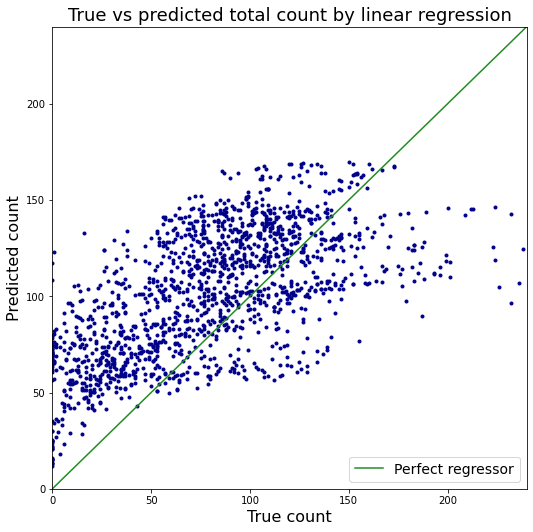

In [346]:
# Testing the model on the fold 3

test_dataset = conic_dataset(X_test, y_test)  # set up the test dataset
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

# Test the model
model.eval()  # eval mode

with torch.no_grad():
    ys_true, ys_pred, L_test = [], [], []

    for  j, (xs, ys) in enumerate(test_loader):
        preds = model(xs)
        loss = torch.sqrt(criterion(preds, ys))
        L_test.append(loss)
        ys_true.append(ys)
        ys_pred.append(preds)
    ys_true = torch.cat(ys_true)  # concatenate the batch prediction into one vector
    ys_pred = torch.cat(ys_pred)  # concatenate the batch prediction into one vector
    ys_true, ys_pred = ys_true.detach().numpy(), ys_pred.detach().numpy()  # convert to numpy
    # calculate all the metrics
    average_test_loss = np.mean(L_test)
    m1 = np.sqrt(mean_squared_error(ys_true, ys_pred))# RMSE
    m2 = stats.pearsonr(ys_true, ys_pred)[0]          # Pearson
    m3 = stats.spearmanr(ys_true, ys_pred)[0]         # Spearman
    m4 = r2_score(ys_true, ys_pred)                   # R-squared

print(f"Conic CNN testing:\n Average test loss: {average_test_loss:.3f}")
print(f" RMSE: {m1:.3f}, Pearson:{m2:.3f}, Spearman:{m3:.3f}, R-squared:{m4:.3f}")


# Plot the scatter plot true vs. predicted
f, a = plt.subplots(1, 1, figsize=(8.5,8.5))

a.scatter(ys_true, ys_pred, marker='.', color='darkblue')
line = Line2D([0,250], [0,250], color='forestgreen', label='Perfect regressor')
a.add_line(line)
a.set_xlim((0,240)); a.set_ylim((0,240))
a.set_title("True vs predicted total count by linear regression", fontsize=18)
a.set_xlabel('True count', fontsize=16)
a.set_ylabel('Predicted count', fontsize=16)

plt.legend(fontsize=14, loc='lower right')
plt.show()

# Save the model checkpoint
torch.save(model.state_dict(), 'CNNmodel.pt')
# if os.path.isfile('CNNmodel.pt'):  # loading the pytorch pretrained model
#     model.load_state_dict(torch.load('CNNmodel.pt'))


In [343]:
# data augumentation -> rotation + mirror flips = getting 6 times more good quality data

X_augumented = []
y_augumented = []
for i, x in enumerate(X_train):
    y = y_train[i]
    Ts = np.array(df_train.loc[i,['T1', 'T2', 'T3', 'T4', 'T5', 'T6']])

    # tranform x and augement it
    x90 = np.rot90(x)      # rotation by 90
    x180 = np.rot90(x90)   # rotation by 180
    x270 = np.rot90(x180)  # rotation by 270
    x_mh = np.fliplr(x)  # mirror horizontal
    x_ud = np.flipud(x)  # mirror vertical

    X_augumented.append(x, x90, x180, x270, x_mh, x_ud)
    y_augumented.append(y, y, y, y, y, y)


[tensor([ 56., 113.,   2.,  78.,  24.,  68.,  59.,  28.,  55.,  62.,  55., 109.,
         80., 111., 201.,  89.,  55., 138., 196.,  25.,  93.,  99.,  49.,  94.,
        193.,  85.,  95.,  79.,  88.,  84.,  77., 129., 121.,  73.,  87.,  66.,
          1.,  33.,  67., 286., 130., 125.,  36., 100.,  85.,   0., 120., 187.,
         79., 143., 125.,   0.,  57., 109., 124., 109., 132., 126.,   0., 107.,
         92., 113.,  76., 113.,  91., 108.,   1.,  96.,  65.,  62.,   7.,  12.,
        107., 196., 126.,  47.,   9., 108.,  38., 127.,  91.,  21.,  56.,  33.,
        163.,  61.,  69., 106.,   5.,  10.,  85., 143.,   0.,  61.,  35., 136.,
          1.,  36.,  39., 136.,  12., 107.,   9.,  94.,  89., 107.,  79., 103.,
         82.,  59.,  25.,  97., 119.,  64.,  57.,  76.,  88., 108.,  40., 104.,
         56.,  99.,  77.,  30.,  64.,  93., 113.,  37.]), tensor([101., 147., 104.,  60., 115.,  34., 142.,  75.,  96., 199.,  17., 134.,
         77.,  51.,  46., 135.,  91.,  86., 101.,  64.,  50.,